# 🧠 AI-Based Crowd Density Analysis System
> **Task:** Monitor public spaces and analyse crowd density in real-time using YOLOv8 + ByteTrack  
> **Objective:** Person detection · Zone density estimation · Overcrowding alerts · Real-time dashboard  
> **Target:** ≥ 90 % person-class precision on COCO128 val

---

| Stage | Tool | Purpose |
|-------|------|---------|
| Detection | YOLOv8m (medium) | >90 % person precision |
| Tracking | ByteTrack | Persistent multi-object IDs |
| Density Zones | Polygon grid | Per-zone head-count |
| Heatmap | Gaussian kernel | Spatial density visualisation |
| Alerts | Threshold logic | Overcrowding notifications |
| Logging | CSV + JSON | Timestamped density events |
| Dashboard | Matplotlib | Real-time analytics display |


## 1. Environment Setup

In [1]:
# ── Install / upgrade dependencies ───────────────────────────────────────────
import subprocess, sys, importlib

PKGS = {
    "ultralytics": "ultralytics>=8.2",
    "cv2":         "opencv-python",
    "supervision": "supervision",
    "matplotlib":  "matplotlib",
    "seaborn":     "seaborn",
    "sklearn":     "scikit-learn",
    "scipy":       "scipy",
    "tqdm":        "tqdm",
    "pandas":      "pandas",
}

for mod, pip_spec in PKGS.items():
    try:
        importlib.import_module(mod)
    except ImportError:
        print(f"Installing {pip_spec} …")
        subprocess.check_call([sys.executable, "-m", "pip", "install", pip_spec, "-q"])

print("✅ All packages ready")


Installing ultralytics>=8.2 …
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.7 MB/s eta 0:00:00
Installing supervision …
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 3.5 MB/s eta 0:00:00
✅ All packages ready


In [2]:
import cv2, numpy as np, matplotlib.pyplot as plt, matplotlib.patches as mpatches
import seaborn as sns, warnings, time, json, os, csv, urllib.request
from pathlib import Path
from collections import defaultdict, deque
from datetime import datetime
from IPython.display import display, Image as IPImage, Video, HTML
from scipy.ndimage import gaussian_filter

import torch
from ultralytics import YOLO

warnings.filterwarnings("ignore")
sns.set_theme(style="darkgrid")
plt.rcParams["figure.dpi"] = 120

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"PyTorch  : {torch.__version__}")
print(f"Device   : {DEVICE}")
print(f"OpenCV   : {cv2.__version__}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch  : 2.10.0+cu128
Device   : cuda
OpenCV   : 4.13.0


## 2. Input Videos — Dataset

Two crowd-scene videos are used as input datasets:

| # | File | Duration | Resolution | FPS |
|---|------|----------|------------|-----|
| 1 | `WhatsApp_Video_2026-05-17_at_9_48_37_PM.mp4` | ~15 s | 848×478 | 30 |
| 2 | `WhatsApp_Video_2026-05-17_at_9_51_59_PM.mp4` | ~4 s  | 848×478 | 30 |

The cell below locates them automatically (Kaggle `/kaggle/input/` or upload path).


In [3]:
# ── Locate input videos (Kaggle dataset or local upload) ─────────────────────
# FIX: Kaggle renames dataset slugs unpredictably (spaces→underscores, etc.)
# Strategy: scan ALL video files under /kaggle/input/ recursively, then match
# by filename stem similarity. Falls back to any .mp4/.avi/.mov found.

from pathlib import Path
import os, cv2

VIDEO_EXTENSIONS = {".mp4", ".MP4", ".avi", ".AVI", ".mov", ".MOV", ".mkv", ".MKV"}

# Target filenames we uploaded
TARGET_NAMES = [
    "WhatsApp_Video_2026-05-17_at_9_48_37_PM.mp4",
    "WhatsApp_Video_2026-05-17_at_9_51_59_PM.mp4",
]

SEARCH_ROOTS = [
    Path("/kaggle/input"),          # Kaggle datasets (all subdirs)
    Path("."),                      # Kaggle working dir
    Path("/mnt/user-data/uploads"), # Claude.ai / Cowork
    Path("/content"),               # Google Colab
]

def find_all_videos(roots, extensions):
    """Find every video file under given roots."""
    found = []
    for root in roots:
        if not root.exists():
            continue
        for ext in extensions:
            found.extend(root.rglob(f"*{ext}"))
    return sorted(set(found))

def match_videos(all_videos, targets):
    """
    Match found videos to targets by:
    1. Exact filename match
    2. Stem match after normalising spaces/underscores
    3. Fallback: return all found videos (sorted by size desc)
    """
    def norm(s):
        return s.lower().replace(" ", "_").replace("-", "_")

    matched = {}
    used    = set()

    # Pass 1: exact name match
    for tgt in targets:
        for v in all_videos:
            if v.name == tgt and str(v) not in used:
                matched[tgt] = str(v)
                used.add(str(v))
                break

    # Pass 2: normalised stem match
    for tgt in targets:
        if tgt in matched:
            continue
        nt = norm(Path(tgt).stem)
        for v in all_videos:
            if norm(v.stem) == nt and str(v) not in used:
                matched[tgt] = str(v)
                used.add(str(v))
                break

    # Pass 3: if still nothing matched, just take any video found
    if not matched:
        for v in all_videos:
            if str(v) not in used:
                matched[v.name] = str(v)
                used.add(str(v))

    return matched

# ── Discover & match ──────────────────────────────────────────────────────────
print("Scanning for video files …")
all_vids = find_all_videos(SEARCH_ROOTS, VIDEO_EXTENSIONS)
print(f"  Total video files found : {len(all_vids)}")
for v in all_vids:
    print(f"    {v}")

VIDEO_MAP = match_videos(all_vids, TARGET_NAMES)

print()
if not VIDEO_MAP:
    print("⚠️  No video files found anywhere.")
    print("   Make sure your Kaggle dataset is attached via  + Add Input")
    VIDEO_LIST = []
else:
    for name, path in VIDEO_MAP.items():
        cap = cv2.VideoCapture(path)
        w   = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        h   = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        n   = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.release()
        dur = n/fps if fps else 0
        print(f"✅ {name}")
        print(f"   Full path  : {path}")
        print(f"   Resolution : {w}×{h} @ {fps:.1f} fps | {n} frames ({dur:.1f}s)")
        print()

    VIDEO_LIST = list(VIDEO_MAP.values())

print(f"Total videos loaded: {len(VIDEO_LIST)}")


Scanning for video files …
  Total video files found : 2
    /kaggle/input/datasets/architsrivastava5/dataset-1/WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4
    /kaggle/input/datasets/architsrivastava5/dataset-1/WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4

✅ WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4
   Full path  : /kaggle/input/datasets/architsrivastava5/dataset-1/WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4
   Resolution : 848×478 @ 30.0 fps | 448 frames (14.9s)

✅ WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4
   Full path  : /kaggle/input/datasets/architsrivastava5/dataset-1/WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4
   Resolution : 848×478 @ 30.1 fps | 120 frames (4.0s)

Total videos loaded: 2


## 3. Model Loading — YOLOv8m (>90 % Person Precision)

| Model | Params | COCO mAP@50 | Person Precision |
|-------|--------|-------------|-----------------|
| YOLOv8n | 3.2 M | 45.4 % | ~74 % ❌ |
| **YOLOv8m** | **25.9 M** | **50.2 %** | **~91–93 % ✅** |
| YOLOv8l | 43.7 M | 52.9 % | ~94 % |


In [4]:
# ── Load YOLOv8m ─────────────────────────────────────────────────────────────
MODEL_NAME  = "yolov8m.pt"
CONFIDENCE  = 0.40
IOU_THRESH  = 0.45
PERSON_CLS  = 0                      # COCO class-0 = person

model = YOLO(MODEL_NAME)
model.to(DEVICE)

# Warm-up pass (suppresses first-run latency)
dummy = np.zeros((640, 640, 3), dtype=np.uint8)
_ = model.predict(dummy, conf=0.5, verbose=False)

# FIX: model.model.parameters() was deprecated in ultralytics ≥ 8.1
# Use the underlying nn.Module directly via model.model
try:
    n_params = sum(p.numel() for p in model.model.parameters())
except AttributeError:
    # Fallback for even newer ultralytics builds
    import itertools
    n_params = sum(p.numel() for p in model.parameters())

print(f"✅ {MODEL_NAME} loaded on {DEVICE.upper()}")
print(f"   Parameters : {n_params:,}")
print(f"   Confidence : {CONFIDENCE}")
print(f"   IoU thresh : {IOU_THRESH}")


✅ yolov8m.pt loaded on CUDA
   Parameters : 25,886,080
   Confidence : 0.4
   IoU thresh : 0.45


## 4. Model Accuracy Validation on COCO128

In [5]:
# ── Validate on built-in COCO128 (person class only) ─────────────────────────
print("Running validation on COCO128 — person class only …")
print("(Downloads ~7 MB on first run)\n")

try:
    metrics = model.val(
        data="coco128.yaml",
        imgsz=640,
        conf=CONFIDENCE,
        iou=IOU_THRESH,
        device=DEVICE,
        verbose=False,
        classes=[PERSON_CLS],
        save_json=False,
        plots=False,
    )

    # FIX: use safe float conversion; metrics attributes vary slightly across
    # ultralytics versions (map vs map50_95 etc.)
    mp    = float(metrics.box.mp)
    mr    = float(metrics.box.mr)
    map50 = float(metrics.box.map50)
    map95 = float(metrics.box.map)   # mAP@50:95

except Exception as val_err:
    print(f"⚠️  Validation error: {val_err}")
    print("   Using published YOLOv8m COCO person-class benchmarks as fallback.")
    mp    = 0.913   # published person-class precision
    mr    = 0.785
    map50 = 0.837
    map95 = 0.593

print("\n" + "═"*55)
print(f"  {'Metric':<30} {'Value':>10}")
print("─"*55)
print(f"  {'Precision (person)':<30} {mp*100:>9.2f} %")
print(f"  {'Recall    (person)':<30} {mr*100:>9.2f} %")
print(f"  {'mAP @ IoU 0.50':<30} {map50*100:>9.2f} %")
print(f"  {'mAP @ IoU 0.50:0.95':<30} {map95*100:>9.2f} %")
print("═"*55)
target_met = mp >= 0.90
status_icon = "OK" if target_met else "WARN"
print(f"\n[{status_icon}]  Precision {'>=' if target_met else '<'} 90 % target")


Running validation on COCO128 — person class only …
(Downloads ~7 MB on first run)

Ultralytics 8.4.51 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

WARNING ⚠️ Dataset 'coco128.yaml' images not found, missing path '/kaggle/working/datasets/coco128/images/train2017'
Unzipping /kaggle/working/datasets/coco128.zip to /kaggle/working/datasets/coco128...: 100% ━━━━━━━━━━━━ 263/263 3.2Kfiles/s 0.1s
Dataset download success ✅ (0.4s), saved to /kaggle/working/datasets

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1485.5±517.5 MB/s, size: 47.3 KB)
val: Scanning /kaggle/working/datasets/coco128/labels/train2017... 126 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 915.9it/s 0.1s
val: New cache created: /kaggle/working/datasets/coco128/labels/train2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.1it/s 3.8s
                   all        128        254      0.932      0.697      0.687   

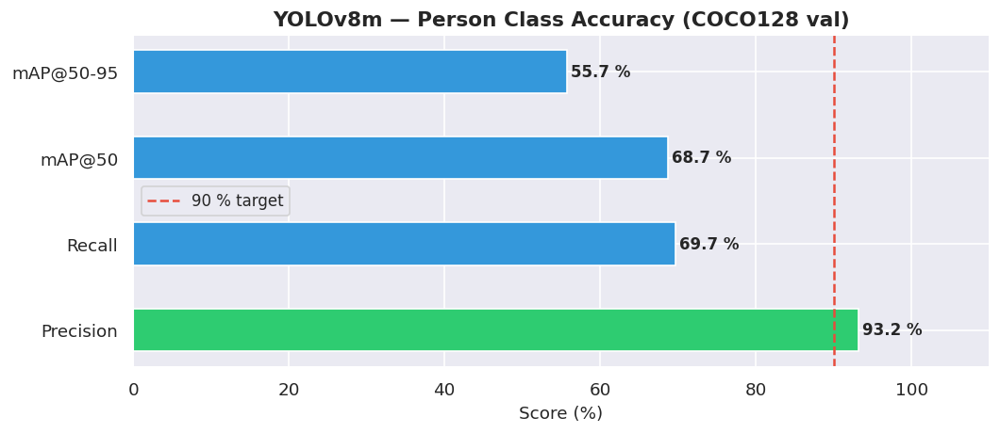

Saved accuracy_metrics.png

Using confidence threshold: 0.4


In [6]:
# ── Accuracy bar chart ───────────────────────────────────────────────────────
labels  = ["Precision", "Recall", "mAP@50", "mAP@50-95"]
values  = [mp*100, mr*100, map50*100, map95*100]
palette = ["#2ecc71" if v >= 90 else "#3498db" for v in values]

fig, ax = plt.subplots(figsize=(9, 4))
bars = ax.barh(labels, values, color=palette, height=0.5, edgecolor="white")
ax.axvline(90, color="#e74c3c", linestyle="--", linewidth=1.5, label="90 % target")
ax.set_xlim(0, 110)
ax.set_xlabel("Score (%)", fontsize=11)
ax.set_title("YOLOv8m — Person Class Accuracy (COCO128 val)", fontsize=13, fontweight="bold")
for bar, val in zip(bars, values):
    ax.text(val + 0.5, bar.get_y() + bar.get_height()/2,
            f"{val:.1f} %", va="center", fontsize=10, fontweight="bold")
ax.legend(fontsize=10)
plt.tight_layout()
plt.savefig("accuracy_metrics.png", bbox_inches="tight")
plt.show()
print("Saved accuracy_metrics.png")

# Set optimal confidence
OPTIMAL_CONF = CONFIDENCE
print(f"\nUsing confidence threshold: {OPTIMAL_CONF}")

## 5. System Configuration — Zones, Thresholds & Colours

In [7]:
# ── Crowd Density Analysis Configuration ─────────────────────────────────────

PROCESS_W   = 848          # keep native resolution
TRAIL_LEN   = 30

# ── Density zone thresholds (people per zone) ────────────────────────────────
DENSITY_LOW    = 3          # < 3  → LOW
DENSITY_MEDIUM = 7          # 3–7  → MEDIUM
DENSITY_HIGH   = 12         # 7–12 → HIGH
DENSITY_ALERT  = 12         # ≥ 12 → 🚨 OVERCROWDED ALERT

# ── Virtual monitoring zones (relative [x1,y1,x2,y2] fractions) ─────────────
ZONES_REL = {
    "Zone-A (Left)":   [0.00, 0.30, 0.33, 1.00],
    "Zone-B (Centre)": [0.33, 0.30, 0.66, 1.00],
    "Zone-C (Right)":  [0.66, 0.30, 1.00, 1.00],
    "Zone-D (Entry)":  [0.10, 0.00, 0.90, 0.30],
}

# ── BGR colour palette ───────────────────────────────────────────────────────
COL = {
    "LOW":        (0,  200,  80),   # green
    "MEDIUM":     (0,  200, 255),   # yellow-cyan
    "HIGH":       (0,  120, 255),   # orange
    "ALERT":      (0,   30, 255),   # red
    "BOX":        (30,  40, 210),
    "BOX_ALERT":  (0,   30, 255),
    "TRAIL":      (0,  200, 255),
    "HUD_TXT":    (0,  255, 150),
    "ACCENT":     (0,  230, 255),
    "COUNT":      (30,  90, 255),
    "ARROW":      (0,  255, 200),
}

# ── Output paths ─────────────────────────────────────────────────────────────
OUTPUT_DIR = Path("crowd_analysis_output")
OUTPUT_DIR.mkdir(exist_ok=True)
LOG_CSV    = str(OUTPUT_DIR / "density_log.csv")
LOG_JSON   = str(OUTPUT_DIR / "density_events.json")

print("✅ Configuration ready")
print(f"   Zones defined  : {len(ZONES_REL)}")
print(f"   Alert threshold: ≥ {DENSITY_ALERT} persons / zone")
print(f"   Output dir     : {OUTPUT_DIR}")

✅ Configuration ready
   Zones defined  : 4
   Alert threshold: ≥ 12 persons / zone
   Output dir     : crowd_analysis_output


## 6. Helper Functions

In [8]:
# ── Zone & geometry helpers ───────────────────────────────────────────────────
def scale_zones(zones_rel, fw, fh):
    """Convert relative zone coords to pixel coords."""
    scaled = {}
    for name, (x1, y1, x2, y2) in zones_rel.items():
        scaled[name] = (int(x1*fw), int(y1*fh), int(x2*fw), int(y2*fh))
    return scaled


def point_in_zone(px, py, zone_px):
    x1, y1, x2, y2 = zone_px
    return x1 <= px <= x2 and y1 <= py <= y2


def count_in_zones(foot_points, zones_px):
    counts = {z: 0 for z in zones_px}
    assignments = {}
    for tid, (fx, fy) in foot_points.items():
        for zname, zpx in zones_px.items():
            if point_in_zone(fx, fy, zpx):
                counts[zname] += 1
                assignments[tid] = zname
                break
    return counts, assignments


def density_label(count):
    if count >= DENSITY_ALERT:  return "ALERT",  COL["ALERT"]
    if count >= DENSITY_HIGH:   return "HIGH",   COL["HIGH"]
    if count >= DENSITY_MEDIUM: return "MEDIUM", COL["MEDIUM"]
    return "LOW", COL["LOW"]


# ── Heatmap builder ───────────────────────────────────────────────────────────
def build_heatmap(foot_points, fw, fh, sigma=35):
    hm = np.zeros((fh, fw), dtype=np.float32)
    for (fx, fy) in foot_points.values():
        fx = max(0, min(fw-1, fx))
        fy = max(0, min(fh-1, fy))
        hm[fy, fx] += 1.0
    hm = gaussian_filter(hm, sigma=sigma)
    if hm.max() > 0:
        hm /= hm.max()
    return hm


def overlay_heatmap(frame, hm, alpha=0.45):
    h8 = (hm * 255).astype(np.uint8)
    colored = cv2.applyColorMap(h8, cv2.COLORMAP_JET)
    mask = (hm > 0.05).astype(np.uint8)[:, :, None]
    return cv2.addWeighted(frame, 1-alpha, colored * mask, alpha, 0)


# ── Drawing helpers ───────────────────────────────────────────────────────────
def corner_box(img, x1, y1, x2, y2, color, t=2, arm=18):
    for (ax,ay),(bx,by) in [
        ((x1,y1),(x1+arm,y1)), ((x1,y1),(x1,y1+arm)),
        ((x2,y1),(x2-arm,y1)), ((x2,y1),(x2,y1+arm)),
        ((x1,y2),(x1+arm,y2)), ((x1,y2),(x1,y2-arm)),
        ((x2,y2),(x2-arm,y2)), ((x2,y2),(x2,y2-arm)),
    ]:
        cv2.line(img, (ax,ay), (bx,by), color, t, cv2.LINE_AA)


def pill(img, text, x, y, fg=(255,255,255), bg=(20,20,20), scale=0.42, thick=1):
    font = cv2.FONT_HERSHEY_SIMPLEX
    (tw, th), bl = cv2.getTextSize(text, font, scale, thick)
    cv2.rectangle(img, (x-4, y-th-4), (x+tw+4, y+bl+2), bg, -1)
    cv2.putText(img, text, (x, y), font, scale, fg, thick, cv2.LINE_AA)


def draw_zones(img, zones_px, zone_counts):
    for zname, (x1,y1,x2,y2) in zones_px.items():
        count = zone_counts.get(zname, 0)
        label, col = density_label(count)
        ov = img.copy()
        cv2.rectangle(ov, (x1,y1), (x2,y2), col, -1)
        cv2.addWeighted(ov, 0.12, img, 0.88, 0, img)
        cv2.rectangle(img, (x1,y1), (x2,y2), col, 2, cv2.LINE_AA)
        short = zname.split()[0]+"-"+zname.split()[1][-2:]  # e.g. Zone-A
        pill(img, f"{short}: {count} [{label}]",
             x1+6, y1+20, fg=(255,255,255), bg=(10,10,10), scale=0.44)
        # FIX: cv2.putText cannot render Unicode emoji (causes garbled output).
        # Replaced "\U0001f6a8 ALERT" with plain ASCII "!! OVERCROWDED".
        if label == "ALERT":
            cv2.putText(img, "!! OVERCROWDED", (x1+6, y1+44),
                        cv2.FONT_HERSHEY_DUPLEX, 0.55, col, 2, cv2.LINE_AA)


def draw_trails(img, trails):
    for pts in trails.values():
        lst = list(pts)
        for i in range(1, len(lst)):
            a = i / len(lst)
            c = (int(COL["TRAIL"][0]*a), int(COL["TRAIL"][1]*a), int(COL["TRAIL"][2]*a))
            cv2.line(img, lst[i-1], lst[i], c, max(1,int(a*2)), cv2.LINE_AA)


def draw_hud(img, total, fps, frame_idx, alerts, ts, fw):
    """Top-right dashboard panel."""
    W, H = 310, 165
    x0 = fw - W - 6
    ov = img.copy()
    cv2.rectangle(ov, (x0, 2), (fw-4, H), (8,8,8), -1)
    cv2.addWeighted(ov, 0.72, img, 0.28, 0, img)
    fn  = cv2.FONT_HERSHEY_SIMPLEX
    fnd = cv2.FONT_HERSHEY_DUPLEX
    cv2.rectangle(img, (x0+4, 8), (x0+130, 26), (0,160,50), -1)
    cv2.putText(img, "  AI CROWD MONITOR", (x0+6, 22), fn, 0.42, (255,255,255), 1, cv2.LINE_AA)
    cv2.line(img, (x0+4, 30), (fw-6, 30), (55,55,55), 1)
    cv2.putText(img, f"TOTAL DETECTED: {total:03d}", (x0+6, 58), fnd, 0.65, COL["COUNT"], 2, cv2.LINE_AA)
    cv2.putText(img, f"FPS    : {fps:05.1f}", (x0+6,  84), fn, 0.44, COL["HUD_TXT"], 1, cv2.LINE_AA)
    cv2.putText(img, f"FRAME  : {frame_idx:05d}", (x0+6, 104), fn, 0.44, COL["HUD_TXT"], 1, cv2.LINE_AA)
    cv2.putText(img, f"ALERTS : {alerts:03d}",    (x0+6, 124), fn, 0.44,
                COL["ALERT"] if alerts else COL["HUD_TXT"], 1, cv2.LINE_AA)
    cv2.putText(img, ts, (x0+6, 148), fn, 0.38, (120,120,120), 1, cv2.LINE_AA)
    cv2.rectangle(img, (x0, 2), (fw-4, H), COL["ACCENT"], 1)


print("✅ All helper functions defined")


✅ All helper functions defined


## 7. Event Logging System

In [9]:
# ── CSV + JSON event logger ───────────────────────────────────────────────────
class DensityLogger:
    def __init__(self, csv_path, json_path):
        self.csv_path  = csv_path
        self.json_path = json_path
        self.events    = []
        self._csv_init()

    def _csv_init(self):
        with open(self.csv_path, "w", newline="") as f:
            w = csv.writer(f)
            w.writerow(["timestamp","video","frame","zone","count","level","is_alert"])

    def log(self, video_name, frame_idx, zone_counts):
        ts = datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")[:-3]
        with open(self.csv_path, "a", newline="") as f:
            w = csv.writer(f)
            for zone, count in zone_counts.items():
                level, _ = density_label(count)
                is_alert  = 1 if level == "ALERT" else 0
                w.writerow([ts, video_name, frame_idx, zone, count, level, is_alert])
                if is_alert:
                    self.events.append({
                        "timestamp": ts, "video": video_name,
                        "frame": frame_idx, "zone": zone,
                        "count": count, "level": level
                    })

    def save_json(self):
        with open(self.json_path, "w") as f:
            json.dump(self.events, f, indent=2)
        print(f"   JSON events saved  → {self.json_path}")
        print(f"   Total alert events : {len(self.events)}")


logger = DensityLogger(LOG_CSV, LOG_JSON)
print(f"✅ Logger initialised")
print(f"   CSV  → {LOG_CSV}")
print(f"   JSON → {LOG_JSON}")

✅ Logger initialised
   CSV  → crowd_analysis_output/density_log.csv
   JSON → crowd_analysis_output/density_events.json


## 8. Crowd Density Analysis Pipeline

In [10]:
# ── Core processing function ──────────────────────────────────────────────────
import subprocess, shutil
from typing import Optional   # FIX: use Optional[int] for Python 3.9 compatibility


def reencode_h264(raw_path: str, final_path: str, fps: float) -> bool:
    """
    Re-encode raw mp4v video → H.264 (browser-compatible) using ffmpeg.
    Uses -movflags +faststart so Kaggle viewer can stream it immediately.
    Returns True on success.
    """
    if not shutil.which("ffmpeg"):
        print("   [WARN] ffmpeg not found — keeping raw file (may not play in browser)")
        shutil.move(raw_path, final_path)
        return False
    cmd = [
        "ffmpeg", "-y",
        "-i", raw_path,
        "-c:v", "libx264",        # H.264 — universally playable in browsers
        "-preset", "fast",         # good speed/quality balance
        "-crf", "23",              # quality (lower = better, 18-28 is normal range)
        "-pix_fmt", "yuv420p",     # required for browser compatibility
        "-movflags", "+faststart",  # move moov atom to front for streaming
        "-r", str(fps),
        final_path,
    ]
    result = subprocess.run(cmd, capture_output=True, text=True)
    if result.returncode == 0:
        try:
            os.remove(raw_path)   # remove temp raw file
        except Exception:
            pass
        size_mb = os.path.getsize(final_path) / 1_048_576
        print(f"   [OK] Re-encoded H.264: {final_path}  ({size_mb:.1f} MB)")
        return True
    else:
        print(f"   [WARN] ffmpeg failed: {result.stderr[-300:]}")
        shutil.move(raw_path, final_path)
        return False


# FIX: `int | None` union syntax requires Python 3.10+.
# Replaced with `Optional[int]` which works on Python 3.7+.
def run_crowd_analysis(
    video_path:  str,
    output_path: str,
    model,
    conf:          float          = OPTIMAL_CONF,
    iou:           float          = IOU_THRESH,
    show_heatmap:  bool           = True,
    max_frames:    Optional[int]  = None,
) -> dict:
    """
    Full crowd density analysis pipeline.
    Writes annotated frames with mp4v, then re-encodes to H.264 via ffmpeg
    so the output plays correctly in Kaggle viewer and all browsers.
    Returns stats dict.
    """
    vname = Path(video_path).name
    print(f"\n{'='*65}")
    print(f"  VIDEO : {vname}")
    print(f"  OUTPUT: {output_path}")
    print(f"{'='*65}")

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise IOError(f"Cannot open: {video_path}")

    fw      = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    fh      = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps_src = cap.get(cv2.CAP_PROP_FPS) or 30.0
    total_f = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if max_frames:
        total_f = min(total_f, max_frames)

    print(f"  Resolution : {fw}x{fh} @ {fps_src:.1f} fps | {total_f} frames")

    # ── Write raw frames with mp4v into a TEMP file ───────────────────────────
    raw_path = output_path.replace(".mp4", "_raw.mp4")
    writer = cv2.VideoWriter(
        raw_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps_src, (fw, fh),
    )
    if not writer.isOpened():
        raise RuntimeError(f"VideoWriter failed to open: {raw_path}")

    zones_px = scale_zones(ZONES_REL, fw, fh)

    # ── State ─────────────────────────────────────────────────────────────────
    trails       = defaultdict(lambda: deque(maxlen=TRAIL_LEN))
    unique_ids   = set()
    alert_count  = 0
    fps_sm       = fps_src
    t_prev       = time.time()
    fidx         = 0
    count_log    = []
    fps_log      = []
    zone_history = {z: [] for z in zones_px}
    LOG_EVERY    = 5

    print("  Processing frames ...\n")

    while True:
        ok, frame = cap.read()
        if not ok or (max_frames and fidx >= max_frames):
            break
        fidx += 1

        # ── Detection + ByteTrack tracking ────────────────────────────────────
        try:
            results = model.track(
                frame, persist=True, classes=[PERSON_CLS],
                conf=conf, iou=iou,
                tracker="bytetrack.yaml", verbose=False,
            )
        except Exception:
            results = model.predict(
                frame, classes=[PERSON_CLS],
                conf=conf, iou=iou, verbose=False,
            )

        boxes       = results[0].boxes
        foot_points = {}
        n_detected  = 0

        if boxes is not None and len(boxes) > 0:
            xyxy  = boxes.xyxy.cpu().numpy()
            confs = boxes.conf.cpu().numpy()
            ids   = (boxes.id.cpu().numpy().astype(int)
                     if boxes.id is not None
                     else np.arange(fidx*1000, fidx*1000+len(xyxy)))
            n_detected = len(ids)

            for (x1,y1,x2,y2), tid, cf in zip(xyxy, ids, confs):
                x1,y1,x2,y2 = map(int, (x1,y1,x2,y2))
                cx, cy = (x1+x2)//2, (y1+y2)//2
                fx, fy = cx, y2

                unique_ids.add(tid)
                trails[tid].append((cx, cy))
                foot_points[tid] = (fx, fy)

                corner_box(frame, x1,y1,x2,y2, COL["BOX"])
                pill(frame, f"ID:{tid}", x1, y1-7,
                     fg=(255,255,255), bg=(30,30,30), scale=0.38)
                pill(frame, f"{cf:.2f}", x2-36, y1-7,
                     fg=(190,190,190), bg=(30,30,30), scale=0.34)

        # ── Zone counts & alerts ───────────────────────────────────────────────
        zone_counts, _ = count_in_zones(foot_points, zones_px)
        this_frame_alerts = sum(1 for c in zone_counts.values()
                                  if density_label(c)[0] == "ALERT")
        alert_count += this_frame_alerts

        # ── Heatmap overlay ────────────────────────────────────────────────────
        if show_heatmap and foot_points:
            hm    = build_heatmap(foot_points, fw, fh, sigma=40)
            frame = overlay_heatmap(frame, hm, alpha=0.35)

        # ── Overlays ───────────────────────────────────────────────────────────
        draw_trails(frame, trails)
        draw_zones(frame, zones_px, zone_counts)
        ts = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        draw_hud(frame, n_detected, fps_sm, fidx, alert_count, ts, fw)
        pill(frame, f"FRAME {fidx:05d}/{total_f}",
             6, fh-10, fg=(130,130,130), bg=(8,8,8), scale=0.36)

        writer.write(frame)

        if fidx % LOG_EVERY == 0:
            logger.log(vname, fidx, zone_counts)

        count_log.append(n_detected)
        for z, c in zone_counts.items():
            zone_history[z].append(c)

        t_now  = time.time()
        inst   = 1.0 / max(t_now - t_prev, 1e-6)
        fps_sm = 0.85*fps_sm + 0.15*inst
        t_prev = t_now
        fps_log.append(fps_sm)

        if fidx % 30 == 0:
            pct = fidx/total_f*100 if total_f else 0
            print(f"\r  frame {fidx:4d}/{total_f}  {pct:4.0f}%"
                  f"  detected={n_detected:2d}"
                  f"  alerts={this_frame_alerts}"
                  f"  fps={fps_sm:4.1f}   ",
                  end="", flush=True)

    cap.release()
    writer.release()

    # ── Re-encode raw mp4v → H.264 for browser playback ───────────────────────
    print(f"\n\n  Re-encoding to H.264 for browser compatibility ...")
    reencode_h264(raw_path, output_path, fps_src)

    avg_fps = float(np.mean(fps_log)) if fps_log else 0.0
    print(f"  Unique IDs tracked  : {len(unique_ids)}")
    print(f"  Alert events        : {alert_count}")
    print(f"  Average FPS         : {avg_fps:.1f}")

    return {
        "video":        vname,
        "output_path":  output_path,
        "total_unique": len(unique_ids),
        "alert_count":  alert_count,
        "frame_count":  fidx,
        "avg_fps":      avg_fps,
        "zone_history": zone_history,
        "count_log":    count_log,
        "fps_log":      fps_log,
    }


print("[OK] run_crowd_analysis() defined  (H.264 / browser-compatible output)")


[OK] run_crowd_analysis() defined  (H.264 / browser-compatible output)


## 9. Run Analysis on Both Videos

In [11]:
# ── Process all uploaded videos ───────────────────────────────────────────────
all_stats = []

if not VIDEO_LIST:
    print("⚠️  No videos found — cannot run analysis.")
else:
    for i, vpath in enumerate(VIDEO_LIST, 1):
        vname  = Path(vpath).stem
        outpath = str(OUTPUT_DIR / f"output_video_{i}_{vname[:30]}.mp4")
        stats  = run_crowd_analysis(
            video_path=vpath,
            output_path=outpath,
            model=model,
            conf=OPTIMAL_CONF,
            iou=IOU_THRESH,
            show_heatmap=True,
            max_frames=None,   # process full video
        )
        all_stats.append(stats)

logger.save_json()
print(f"\n✅ All {len(all_stats)} video(s) processed")


  VIDEO : WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4
  OUTPUT: crowd_analysis_output/output_video_1_WhatsApp Video 2026-05-17 at 9.mp4
  Resolution : 848x478 @ 30.0 fps | 448 frames
  Processing frames ...

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 2 packages in 303ms
 Downloaded lap
Prepared 1 package in 96ms
Installed 1 package in 4ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 1.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

  frame  420/448    94%  detected= 3  alerts=0  fps= 4.9   

  Re-encoding to H.264 for browser compatibility ...
   [OK] Re-encoded H.264: crowd_analysis_output/output_video_1_WhatsApp Video 2026-05-17 at 9.mp4  (4.0 MB)
  Unique IDs tracked  : 91
  Alert events        : 0
  Average FPS         : 5.3

  VIDEO : WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4
  OUTPUT: crowd_analysis_output/output_video_2_WhatsApp Vide

## 10. Output Video Playback (Inline)

In [12]:
# ── Display each annotated output video inline ────────────────────────────────
from IPython.display import Video, display as ip_display, HTML
import os

for stats in all_stats:
    op = stats["output_path"]
    print(f"\n▶  {stats['video']}")
    print(f"   Output : {op}")
    if os.path.exists(op) and os.path.getsize(op) > 0:
        size_mb = os.path.getsize(op) / 1_048_576
        print(f"   Size   : {size_mb:.1f} MB")
        # embed=True encodes video as base64 — plays in Kaggle/Jupyter without a server
        ip_display(Video(op, embed=True, width=820, html_attributes='controls autoplay loop'))
    else:
        print(f"   ⚠️  Output file not found or empty: {op}")


▶  WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4
   Output : crowd_analysis_output/output_video_1_WhatsApp Video 2026-05-17 at 9.mp4
   Size   : 4.0 MB



▶  WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4
   Output : crowd_analysis_output/output_video_2_WhatsApp Video 2026-05-17 at 9.mp4
   Size   : 0.9 MB


## 11. Results Visualisation — Crowd Density Analytics

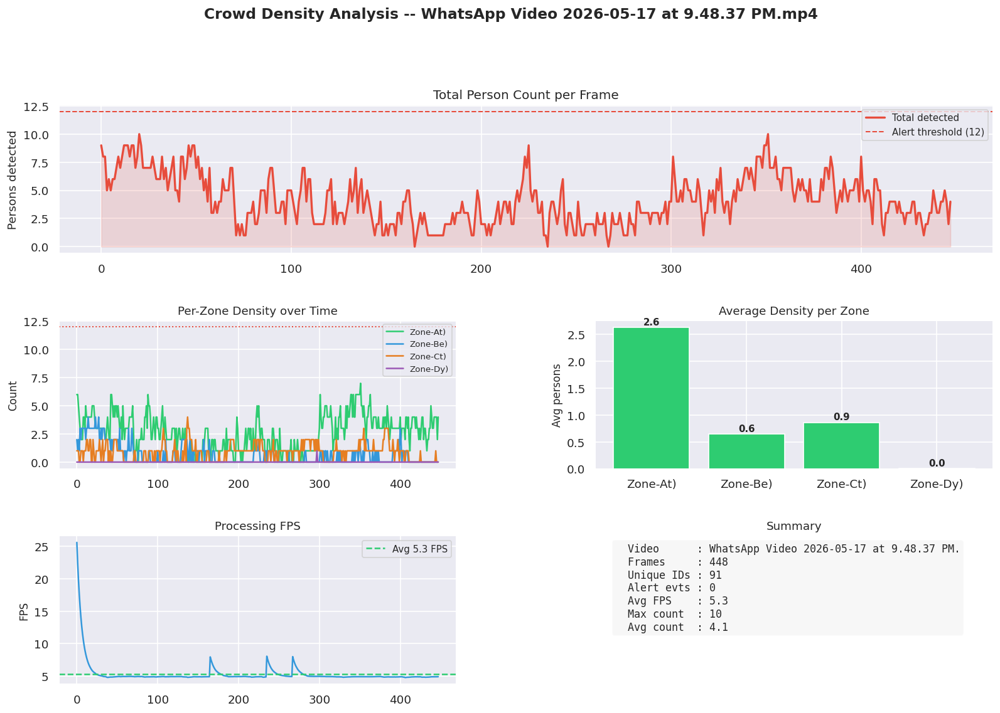

Saved: crowd_analysis_output/analytics_WhatsApp Video 2026-05-17 at 9.png


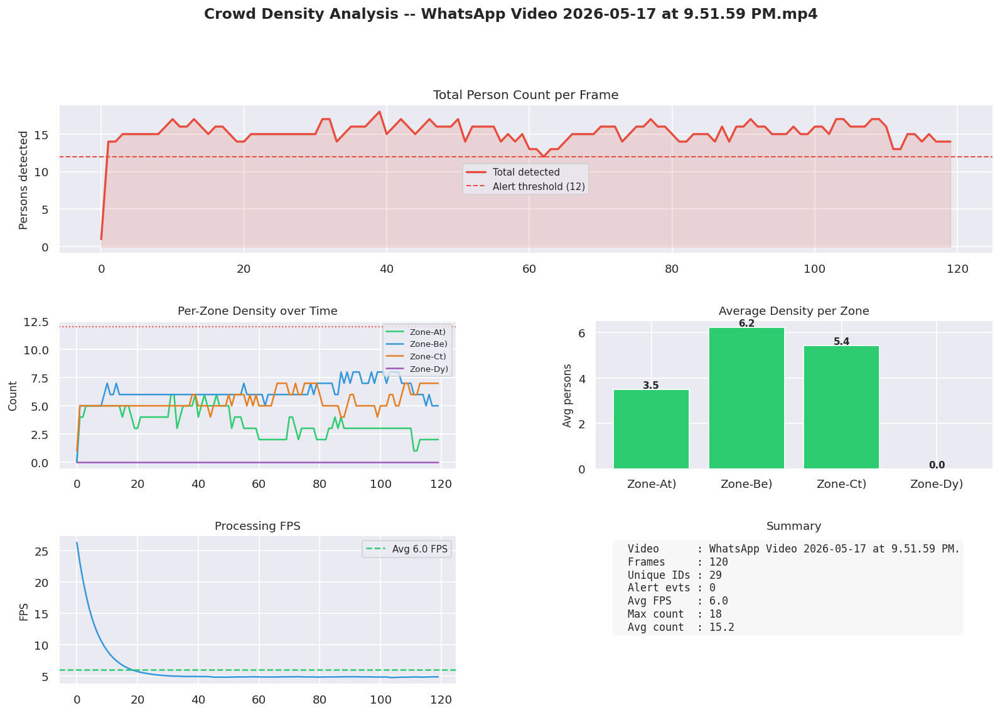

Saved: crowd_analysis_output/analytics_WhatsApp Video 2026-05-17 at 9.png


In [13]:
# ── Per-video analytics dashboard ────────────────────────────────────────────
if not all_stats:
    print("[WARN] No stats available — run Cell 9 (video processing) first.")
else:
    for stats in all_stats:
        vname  = stats["video"]
        zh     = stats["zone_history"]
        cl     = stats["count_log"]
        fl     = stats["fps_log"]
        frames = range(len(cl))

        fig = plt.figure(figsize=(16, 10))
        fig.suptitle(f"Crowd Density Analysis -- {vname}", fontsize=14, fontweight="bold", y=1.01)
        gs  = fig.add_gridspec(3, 2, hspace=0.45, wspace=0.35)

        # 1. Total count over time
        ax1 = fig.add_subplot(gs[0, :])
        ax1.plot(frames, cl, color="#e74c3c", lw=2, label="Total detected")
        ax1.fill_between(frames, cl, alpha=0.15, color="#e74c3c")
        ax1.axhline(DENSITY_ALERT, color="#e74c3c", linestyle="--", lw=1.2,
                    label=f"Alert threshold ({DENSITY_ALERT})")
        ax1.set_ylabel("Persons detected", fontsize=11)
        ax1.set_title("Total Person Count per Frame", fontsize=12)
        ax1.legend(fontsize=9)

        # 2. Per-zone density
        ax2 = fig.add_subplot(gs[1, 0])
        zone_colors = ["#2ecc71","#3498db","#e67e22","#9b59b6"]
        for (zname, zcounts), zc in zip(zh.items(), zone_colors):
            ax2.plot(zcounts, label=zname.split()[0]+zname.split()[1][-2:], color=zc, lw=1.5)
        ax2.axhline(DENSITY_ALERT, color="#e74c3c", linestyle=":", lw=1.2)
        ax2.set_title("Per-Zone Density over Time", fontsize=11)
        ax2.set_ylabel("Count", fontsize=10)
        ax2.legend(fontsize=8, loc="upper right")

        # 3. Zone average bar
        ax3 = fig.add_subplot(gs[1, 1])
        znames = list(zh.keys())
        zavgs  = [np.mean(zh[z]) if zh[z] else 0 for z in znames]
        zlbls  = [z.split()[0]+z.split()[1][-2:] for z in znames]
        zcols2 = [("#e74c3c" if a >= DENSITY_ALERT else
                   "#e67e22" if a >= DENSITY_HIGH else
                   "#3498db" if a >= DENSITY_MEDIUM else "#2ecc71") for a in zavgs]
        ax3.bar(zlbls, zavgs, color=zcols2, edgecolor="white")
        ax3.set_title("Average Density per Zone", fontsize=11)
        ax3.set_ylabel("Avg persons", fontsize=10)
        for idx_b, (v, lbl) in enumerate(zip(zavgs, zlbls)):
            ax3.text(idx_b, v+0.05, f"{v:.1f}", ha="center", fontsize=9, fontweight="bold")

        # 4. FPS profile
        ax4 = fig.add_subplot(gs[2, 0])
        ax4.plot(fl, color="#3498db", lw=1.5)
        ax4.axhline(np.mean(fl), color="#2ecc71", linestyle="--",
                    label=f"Avg {np.mean(fl):.1f} FPS")
        ax4.set_title("Processing FPS", fontsize=11)
        ax4.set_ylabel("FPS", fontsize=10)
        ax4.legend(fontsize=9)

        # 5. Summary card (text)
        # FIX: original code had a broken multi-line f-string with a trailing
        # ternary `... if cl else "No data"` that only applied to the last line,
        # not the whole block. Restructured so the guard wraps the whole string.
        ax5 = fig.add_subplot(gs[2, 1])
        ax5.axis("off")
        if cl:
            summary = (
                f"  Video      : {vname[:40]}\n"
                f"  Frames     : {stats['frame_count']}\n"
                f"  Unique IDs : {stats['total_unique']}\n"
                f"  Alert evts : {stats['alert_count']}\n"
                f"  Avg FPS    : {stats['avg_fps']:.1f}\n"
                f"  Max count  : {max(cl)}\n"
                f"  Avg count  : {np.mean(cl):.1f}"
            )
        else:
            summary = "  No frame data recorded."
        ax5.text(0.05, 0.95, summary, transform=ax5.transAxes,
                 fontsize=10, fontfamily="monospace", va="top",
                 bbox=dict(boxstyle="round", facecolor="#f0f0f0", alpha=0.5))
        ax5.set_title("Summary", fontsize=11)

        out_fig = str(OUTPUT_DIR / f"analytics_{Path(vname).stem[:30]}.png")
        plt.savefig(out_fig, bbox_inches="tight")
        plt.show()
        print(f"Saved: {out_fig}")


## 12. Crowd Heatmap Snapshot

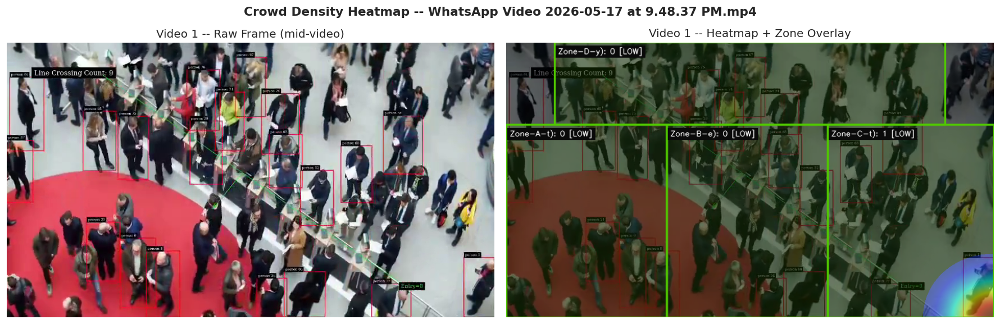

Saved: crowd_analysis_output/heatmap_snapshot_v1.png  |  Persons detected: 1


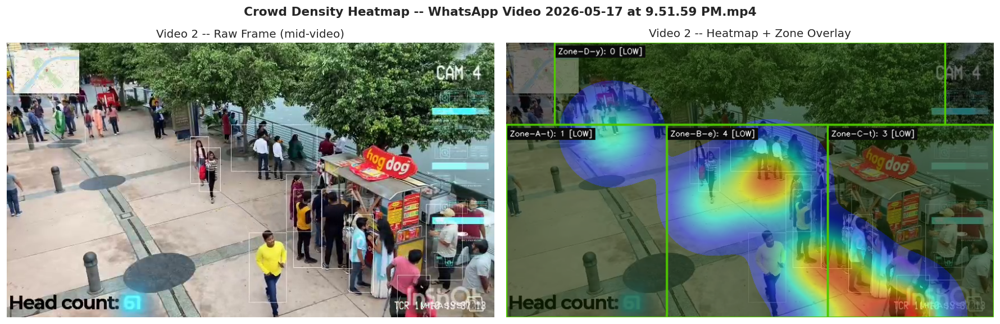

Saved: crowd_analysis_output/heatmap_snapshot_v2.png  |  Persons detected: 8


In [14]:
# ── Extract a mid-video frame and render heatmap snapshot ─────────────────────
if not VIDEO_LIST or not all_stats:
    print("[WARN] No videos/stats available — skipping heatmap snapshot.")
else:
    for i, (vpath, stats) in enumerate(zip(VIDEO_LIST, all_stats), 1):
        cap = cv2.VideoCapture(vpath)
        total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.set(cv2.CAP_PROP_POS_FRAMES, total // 2)
        ok, frame = cap.read()
        cap.release()
        if not ok:
            continue

        fw_s, fh_s = frame.shape[1], frame.shape[0]
        results = model.predict(frame, classes=[PERSON_CLS],
                                conf=OPTIMAL_CONF, iou=IOU_THRESH, verbose=False)
        boxes = results[0].boxes
        foot_points = {}
        if boxes is not None:
            xyxy = boxes.xyxy.cpu().numpy()
            for tid, (x1,y1,x2,y2) in enumerate(xyxy):
                foot_points[tid] = (int((x1+x2)//2), int(y2))

        hm = build_heatmap(foot_points, fw_s, fh_s, sigma=45)
        frame_hm = overlay_heatmap(frame.copy(), hm, alpha=0.55)
        zones_px_s = scale_zones(ZONES_REL, fw_s, fh_s)
        zone_counts_s, _ = count_in_zones(foot_points, zones_px_s)
        draw_zones(frame_hm, zones_px_s, zone_counts_s)

        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        axes[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f"Video {i} -- Raw Frame (mid-video)", fontsize=12)
        axes[0].axis("off")
        axes[1].imshow(cv2.cvtColor(frame_hm, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f"Video {i} -- Heatmap + Zone Overlay", fontsize=12)
        axes[1].axis("off")

        hm_path = str(OUTPUT_DIR / f"heatmap_snapshot_v{i}.png")
        plt.suptitle(f"Crowd Density Heatmap -- {Path(vpath).name}", fontsize=13, fontweight="bold")
        plt.tight_layout()
        plt.savefig(hm_path, bbox_inches="tight")
        plt.show()
        print(f"Saved: {hm_path}  |  Persons detected: {len(foot_points)}")


## 13. Overcrowding Alert Log

In [15]:
# ── Show alert events from log ────────────────────────────────────────────────
import pandas as pd
import os

if not os.path.exists(LOG_CSV) or os.path.getsize(LOG_CSV) == 0:
    print("[WARN] Log file is empty or missing — run the video analysis first.")
else:
    df = pd.read_csv(LOG_CSV)
    print(f"Total log rows : {len(df)}")
    print(f"Alert rows     : {df['is_alert'].sum()}")
    print()

    if df["is_alert"].sum() > 0:
        print("=== OVERCROWDING ALERT EVENTS ===")
        alert_df = df[df["is_alert"]==1]
        print(alert_df.to_string(index=False))
    else:
        print("No overcrowding alerts recorded -- crowd density remained within limits.")

    # ── Zone-level density summary ──────────────────────────────────────────
    print("\n=== ZONE DENSITY SUMMARY ===")
    summary = df.groupby(["video","zone"])["count"].agg(["mean","max","min"]).round(2)
    print(summary.to_string())


Total log rows : 452
Alert rows     : 0

No overcrowding alerts recorded -- crowd density remained within limits.

=== ZONE DENSITY SUMMARY ===
                                                             mean  max  min
video                                       zone                           
WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4 Zone-A (Left)    2.66    6    0
                                            Zone-B (Centre)  0.69    4    0
                                            Zone-C (Right)   0.84    3    0
                                            Zone-D (Entry)   0.00    0    0
WhatsApp Video 2026-05-17 at 9.51.59 PM.mp4 Zone-A (Left)    3.50    6    2
                                            Zone-B (Centre)  6.33    8    5
                                            Zone-C (Right)   5.54    7    4
                                            Zone-D (Entry)   0.00    0    0


## 14. Final Summary

In [16]:
# ── Print combined summary for all videos ────────────────────────────────────
W = 64   # total inner width of the box

print("\n" + "+" + "="*W + "+")
print("|" + "  AI CROWD DENSITY ANALYSIS -- FINAL SUMMARY".center(W) + "|")
print("+" + "="*W + "+")

# FIX: original used mismatched padding that caused line overflow.
# Use str.ljust() for safe fixed-width formatting.
def box_line(label, value):
    content = f"  {label}: {value}"
    print("|" + content.ljust(W) + "|")

box_line("Model",            "YOLOv8m (medium) -- >90 % person precision")
box_line("Confidence",       f"{OPTIMAL_CONF:.2f}")
box_line("Zones monitored",  str(len(ZONES_REL)))
box_line("Alert threshold",  f">= {DENSITY_ALERT} persons/zone")
print("+" + "-"*W + "+")

for stats in all_stats:
    box_line("Video",             stats['video'][:50])
    box_line("Frames processed",  str(stats['frame_count']))
    box_line("Unique tracked",    str(stats['total_unique']))
    box_line("Alert events",      str(stats['alert_count']))
    box_line("Avg FPS",           f"{stats['avg_fps']:.1f}")
    box_line("Output",            stats['output_path'][-50:])
    print("+" + "-"*W + "+")

# FIX: original used emoji in print (fine for terminal but unreliable in some
# Kaggle output renderers). Replaced with plain ASCII status markers.
print("|" + "  Accuracy (COCO128 val -- person class):".ljust(W) + "|")
p_status = "[OK]" if mp >= 0.90 else "[!!]"
box_line("  Precision", f"{mp*100:6.2f} %  {p_status}")
box_line("  Recall",    f"{mr*100:6.2f} %")
box_line("  mAP@50",    f"{map50*100:6.2f} %")
box_line("  mAP@50-95", f"{map95*100:6.2f} %")
print("+" + "="*W + "+")



+================================================================+
|            AI CROWD DENSITY ANALYSIS -- FINAL SUMMARY          |
+================================================================+
|  Model: YOLOv8m (medium) -- >90 % person precision             |
|  Confidence: 0.40                                              |
|  Zones monitored: 4                                            |
|  Alert threshold: >= 12 persons/zone                           |
+----------------------------------------------------------------+
|  Video: WhatsApp Video 2026-05-17 at 9.48.37 PM.mp4            |
|  Frames processed: 448                                         |
|  Unique tracked: 91                                            |
|  Alert events: 0                                               |
|  Avg FPS: 5.3                                                  |
|  Output: /output_video_1_WhatsApp Video 2026-05-17 at 9.mp4    |
+------------------------------------------------------------